In [ ]:
!pip install lime
!pip install shap
!pip install eli5

In [ ]:
#linear algebra
import numpy as np 
import math

#data tools
from copy import copy
import pandas as pd
from scipy.stats import boxcox
from scipy.special import boxcox1p
from scipy.special import inv_boxcox
from sklearn.preprocessing import PowerTransformer, RobustScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import LabelEncoder

#plots
import seaborn as sns
import matplotlib.pyplot as plt

#models
from sklearn.linear_model import LinearRegression, Lasso, Ridge, RidgeCV, LassoCV
from sklearn.ensemble import RandomForestRegressor

#model interpretation modules
import lime
import lime.lime_tabular
import shap
import eli5

#metrics
from sklearn.metrics import mean_squared_error, r2_score

#awesome interactive map library
import folium
from folium.plugins import HeatMap


sns.set_style("whitegrid")

In [ ]:
data = pd.read_csv('/content/AB_NYC_2019.csv')

# Overview

Dataset overall shape.

In [ ]:
print("Dataset contains {} samples of {} features.".format(data.shape[0],data.shape[1]))

Dataset contains 48895 samples of 16 features.


Checking of data types.

In [ ]:
data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [ ]:
print('Number of quantitative features: {}'.format(len([d for d in data.columns if data.dtypes[d] != 'object'])))
print('Number of qualitative features: {}'.format(len([d for d in data.columns if data.dtypes[d] == 'object'])))

Number of quantitative features: 10
Number of qualitative features: 6


In [ ]:
data.drop('id', axis=1, inplace=True)
data.drop('host_id', axis=1, inplace=True)
data.drop('name', axis=1, inplace=True)
data.drop('host_name', axis=1, inplace=True)

# Target - 'price'

The main objective of this dataset is to predict 'price' of a particular advertisement. 
So let us take a quick preview of our target variable - 'price'.

Text(0.5, 0.98, 'Distribution of prices (with outliers)')

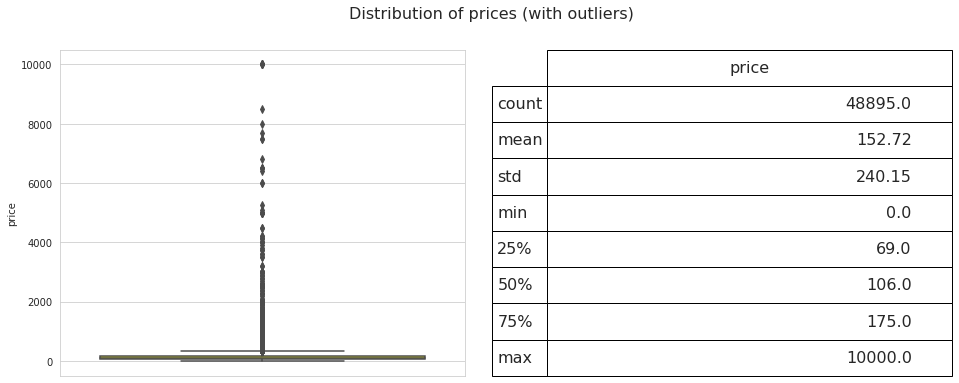

In [ ]:
fig = plt.figure(figsize=(16,6))

ax1 = fig.add_subplot(121)
# ax1.boxplot(data['price'])
sns.boxplot(y = data['price'], ax=ax1, color='yellow')
describe = data['price'].describe().to_frame().round(2)

ax2 = fig.add_subplot(122)
ax2.axis('off')
font_size = 16
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of prices (with outliers)', fontsize=16)

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


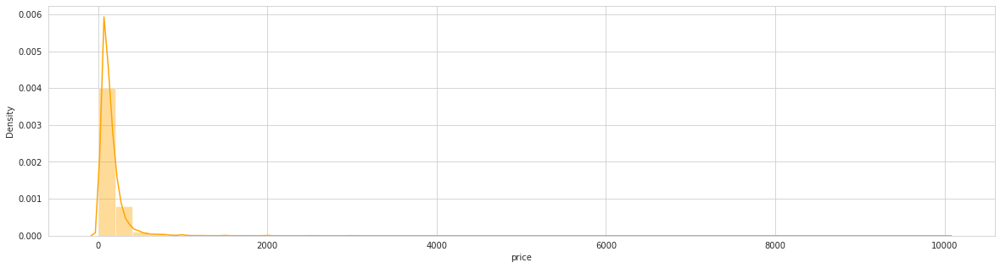

In [ ]:
fig = plt.figure(figsize=(20,5))
sns.distplot(data['price'],color='orange')
plt.show()

Distribution of rental price is:
- Deviating from normal distribution. 
- Having appreciable positive skewness.
- Showing peakdness.
    
and also:

In [ ]:
print('Skewness: {}'.format(data['price'].skew()))
#Skewness - measure of symmetry/assymetry of distribution. If the distribution is perfectly symmetrical, 
#the value of skewness is equal to 0. If skewness > 0 : positive, if skewness < 0 : negative
print('Kurtosis: {}'.format(data['price'].kurt()))
#Kurtosis - measure of flattening distribution of a feature. 

Skewness: 19.118938995046033
Kurtosis: 585.6728788988286


# Pairplot

In [ ]:
# sns.pairplot(data)

# Outliers

To detect ouliers on our target - 'price', Tukey test will be implemented, which defines an interquartile range comprised between the 1st and 3rd quartile of the distribution values (IQR). Outliers are rows whose values are outside IQR.

In [ ]:
def tukey_outliers(df, column):
  Q1 = np.percentile(df[column], 25)
  Q3 = np.percentile(df[column], 75)
  IQR = Q3 - Q1
  outlier_step = 1.5 * IQR
  outliers_index = df[(df[column] < Q1 - outlier_step) | (df[column] > Q3 + outlier_step)].index
  return outliers_index

In [ ]:
outliers_index = tukey_outliers(data,'price')

In [ ]:
data.drop(outliers_index, inplace=True)

In [ ]:
data.reset_index(drop=True, inplace=True)

# Zero values in 'price' 
Because as we assume that, you cannot rent a room for free. 0 values in target price can affect our estimator as well as outliers, so we have to remove from our data samples whose price is 0. 

In [ ]:
data[data['price']==0].head()

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
21946,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28
24114,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127
24304,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0
24420,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0
24443,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,2018-01-02,0.15,1,73


In [ ]:
print('Together we have {} listings with price equal to 0.'.format(len(data[data['price']==0])))

Together we have 11 listings with price equal to 0.


In [ ]:
data[data['price']==0].index

Int64Index([21946, 24114, 24304, 24420, 24443, 24457, 24458, 24459, 24906,
            25462, 25486],
           dtype='int64')

In [ ]:
data.drop(data[data['price']==0].index, inplace=True)

In [ ]:
data.reset_index(drop=True, inplace=True)

# Data cleaning

Null values in dataset.

In [ ]:
missing_values = data.isnull().sum().sort_values(ascending=False)
percentage_missing_values = round((data.isnull().sum()/data.isnull().sum().sum()).sort_values(ascending=False),3)
null_in_data = pd.concat([missing_values, percentage_missing_values],keys=['Missing values','Percentage'],axis=1)
null_in_data.head(5)

,Missing values,Percentage
reviews_per_month,9011,0.5
last_review,9011,0.5
availability_365,0,0.0
calculated_host_listings_count,0,0.0
number_of_reviews,0,0.0


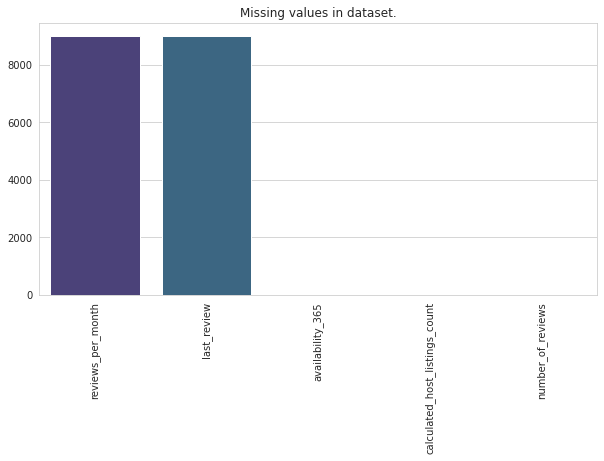

In [ ]:
plt.figure(figsize=(10,5))
missing_plot = sns.barplot(x=missing_values.index[0:5],y=missing_values[0:5],palette='viridis')
missing_plot.set_xticklabels(missing_plot.get_xticklabels(),rotation=90)
plt.title('Missing values in dataset.')
plt.show()

In [ ]:
data['last_review'].head()

0    2018-10-19
1    2019-05-21
2           NaN
3    2019-07-05
4    2018-11-19
Name: last_review, dtype: object

In [ ]:
data['reviews_per_month'].head()

0    0.21
1    0.38
2     NaN
3    4.64
4    0.10
Name: reviews_per_month, dtype: float64

In [ ]:
# data['host_name'].head()

In [ ]:
# data['name'].head()

Analysing the missing values, I've come to the conclusion that for:
 - 'reviews_per_month' : fill NaN values with 0
 - 'host_name': fill NaN name with None
 - 'name' : fill NaN listing name with None
 - 'last_reviews': feature to drop
 

In [ ]:
data['reviews_per_month'].fillna(value=0, inplace=True)
# data['host_name'].fillna(value='None',inplace=True)
# data['name'].fillna(value='None',inplace=True)
data.drop('last_review',axis=1,inplace=True)

Now our dataset is free of missing values.

In [ ]:
data.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64

After cleaning the dataset, there is no NaN values and for quantitative data we are able to show more invormative plots.

# Entry visualizations

Distribution of accomodations through heatmap.

In [ ]:
# NY_map = folium.Map([40.730610,-73.935242],zoom_start=10)
# HeatMap(data[['latitude','longitude']].dropna(),radius=10).add_to(NY_map)
# display(NY_map)

### Visualization 1: The most common advertising districts.

Number of listings in particural neighbourhoods.

In [ ]:
listings = data['neighbourhood_group'].value_counts()
print(listings)

Manhattan        19505
Brooklyn         19406
Queens            5567
Bronx             1069
Staten Island      365
Name: neighbourhood_group, dtype: int64


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


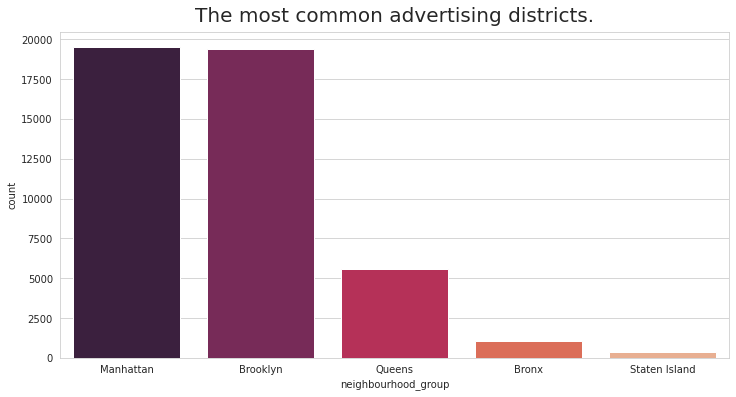

In [ ]:
plt.figure(figsize=(12,6))
listings1plot=sns.countplot(data['neighbourhood_group'],order=data['neighbourhood_group'].value_counts().index,palette='rocket')
plt.title('The most common advertising districts.',size=20,pad=10)
plt.show()

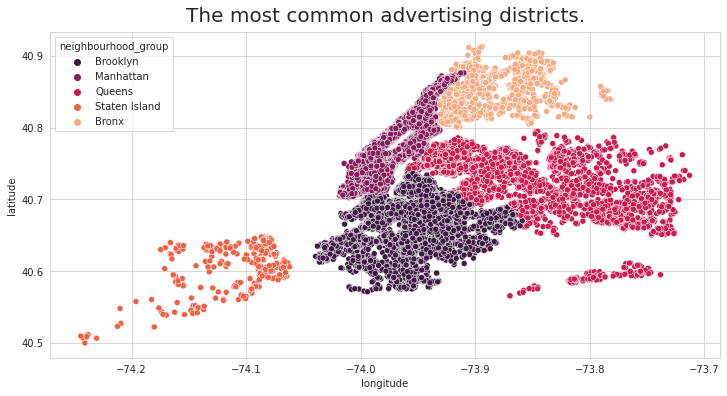

In [ ]:
plt.figure(figsize=(12,6))
sns.scatterplot(x=data['longitude'],y=data['latitude'],hue=data['neighbourhood_group'].sort_values(ascending=False),palette='rocket')
plt.title('The most common advertising districts.',size=20,pad=10)
plt.show()

### Visualization 2: Top 25 most popular neighborhoods from advertisements.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


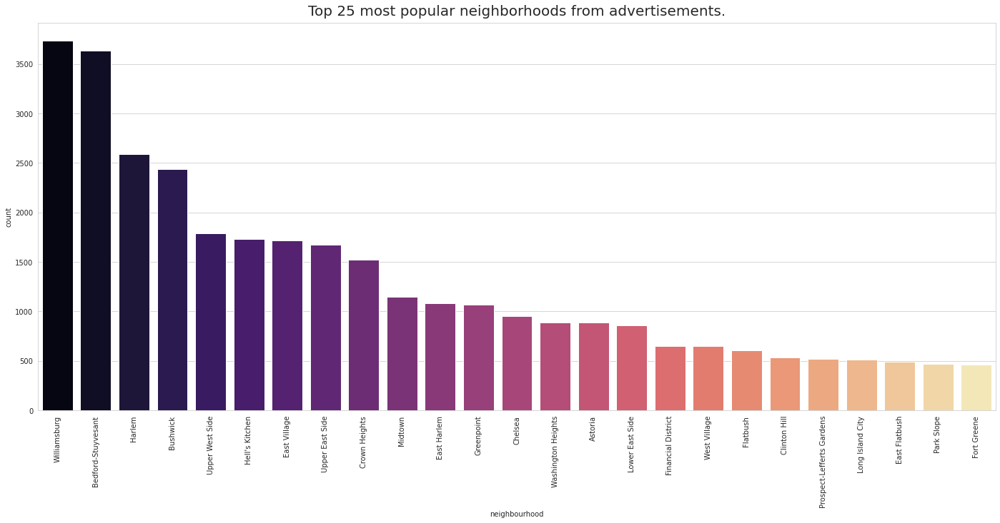

In [ ]:
plt.figure(figsize=(24,10))
listings2plot = sns.countplot(data['neighbourhood'],order=data['neighbourhood'].value_counts().index[0:25],palette='magma')
listings2plot.set_xticklabels(listings2plot.get_xticklabels(),rotation=90)
plt.title('Top 25 most popular neighborhoods from advertisements.',size=20,pad=10)
plt.show()

### Visualization 3: Prices through districts.

Mean price for whole city:

In [ ]:
data['price'].describe()

count    45912.000000
mean       119.999063
std         68.133003
min         10.000000
25%         65.000000
50%        100.000000
75%        159.000000
max        334.000000
Name: price, dtype: float64

The mean price of an advertisement will allow to better representation of advertisements locations by scattered plots.

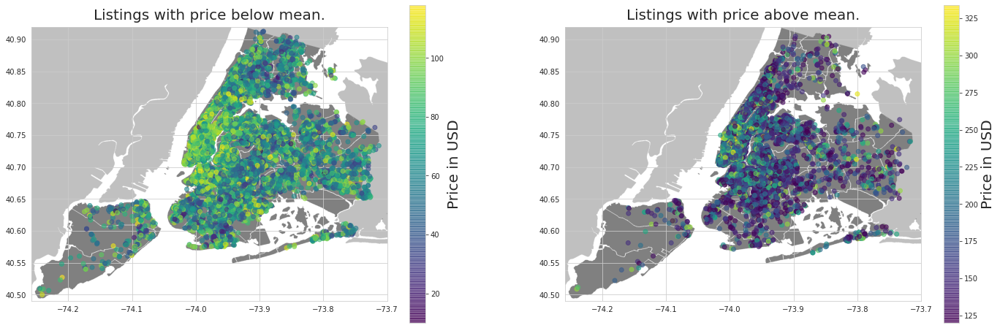

In [ ]:
import urllib

i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread(i)
fig,(ax1, ax2) = plt.subplots(1,2,figsize=(24,8))

ax1.imshow(nyc_img, extent=[-74.258, -73.7, 40.49, 40.92])
ax2.imshow(nyc_img, extent=[-74.258, -73.7, 40.49, 40.92])
plot1 = ax1.scatter(data['longitude'][data['price']<119], data['latitude'][data['price']<119], c=data['price'][data['price']<119], cmap='viridis', linewidth=1, alpha=0.6)
plot2 = ax2.scatter(data['longitude'][data['price']>119], data['latitude'][data['price']>119], c=data['price'][data['price']>119], cmap='viridis', linewidth=1, alpha=0.6)
cbar1 = fig.colorbar(plot1,ax=ax1)
cbar2 = fig.colorbar(plot2,ax=ax2)
cbar1.set_label('Price in USD',size=20)
cbar2.set_label('Price in USD',size=20)

ax1.set_title('Listings with price below mean.', size=20, pad=10)
ax2.set_title('Listings with price above mean.', size=20, pad=10)
plt.show()

Mean price in particular districts.

In [ ]:
data.groupby(["neighbourhood_group"])['price'].mean()

neighbourhood_group
Bronx             77.437792
Brooklyn         105.748634
Manhattan        145.960318
Queens            88.904437
Staten Island     89.235616
Name: price, dtype: float64

### Visualization 4: Distribution of prices in particular districts.

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
`distplot` is a deprecated function and will

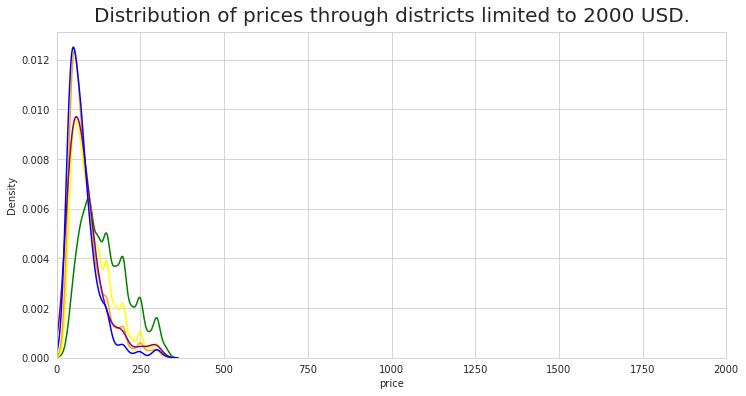

In [ ]:
plt.figure(figsize=(12,6))
sns.distplot(data[data['neighbourhood_group']=='Manhattan'].price,color='green',hist=False,label='Manhattan')
sns.distplot(data[data['neighbourhood_group']=='Brooklyn'].price,color='yellow',hist=False,label='Brooklyn')
sns.distplot(data[data['neighbourhood_group']=='Queens'].price,color='orange',hist=False,label='Queens')
sns.distplot(data[data['neighbourhood_group']=='Staten Island'].price,color='purple',hist=False,label='Staten Island')
sns.distplot(data[data['neighbourhood_group']=='Bronx'].price,color='blue',hist=False,label='Bronx')
plt.title('Distribution of prices through districts limited to 2000 USD.', size=20, pad=10)
plt.xlim(0,2000)
plt.show()

### Visualization 5: Prices through neighbourhoods.

In [ ]:
neighbourhood_mean_prices = data.groupby('neighbourhood').agg({'price': 'mean'}).sort_values('price',ascending=False).reset_index()

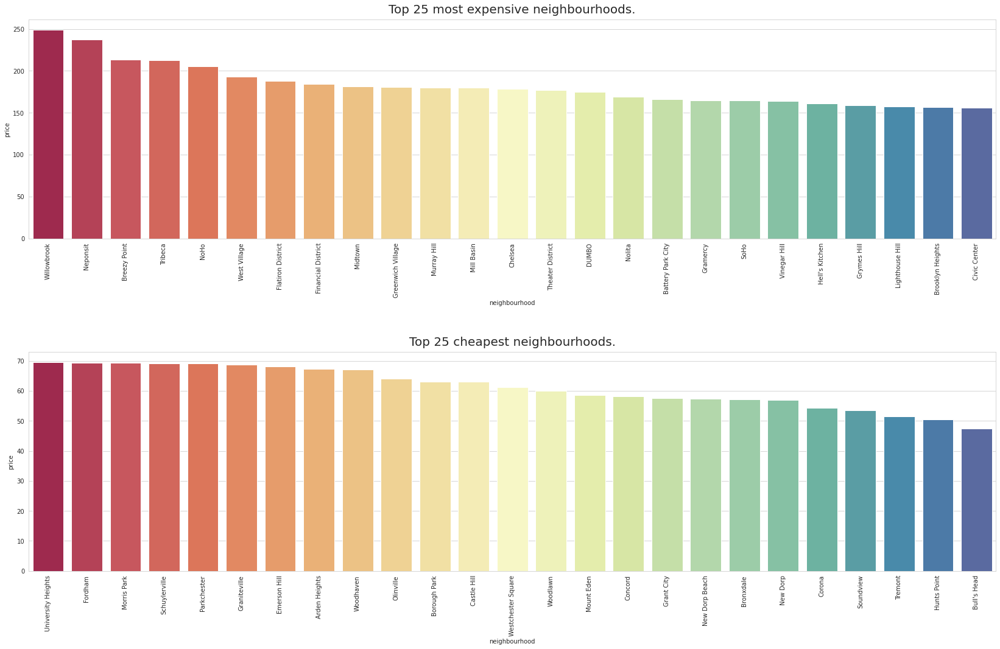

In [ ]:
fig, ax = plt.subplots(2,1,figsize=(24,16))
neighbourhood_prices_max=sns.barplot(x=neighbourhood_mean_prices['neighbourhood'][0:25], y=neighbourhood_mean_prices['price'],palette='Spectral',ax=ax[0])
neighbourhood_prices_max.set_xticklabels(neighbourhood_prices_max.get_xticklabels(),rotation=90)
neighbourhood_prices_max.set_title("Top 25 most expensive neighbourhoods.",size=20,pad=10)
neighbourhood_prices_min=sns.barplot(x=neighbourhood_mean_prices['neighbourhood'][-25:], y=neighbourhood_mean_prices['price'],palette='Spectral',ax=ax[1])
neighbourhood_prices_min.set_xticklabels(neighbourhood_prices_min.get_xticklabels(),rotation=90)
neighbourhood_prices_min.set_title("Top 25 cheapest neighbourhoods.",size=20,pad=10)
fig.tight_layout(pad=5.0)
plt.show()


## Manhattan

In [ ]:
manhattan_data = data[data['neighbourhood_group']=='Manhattan']

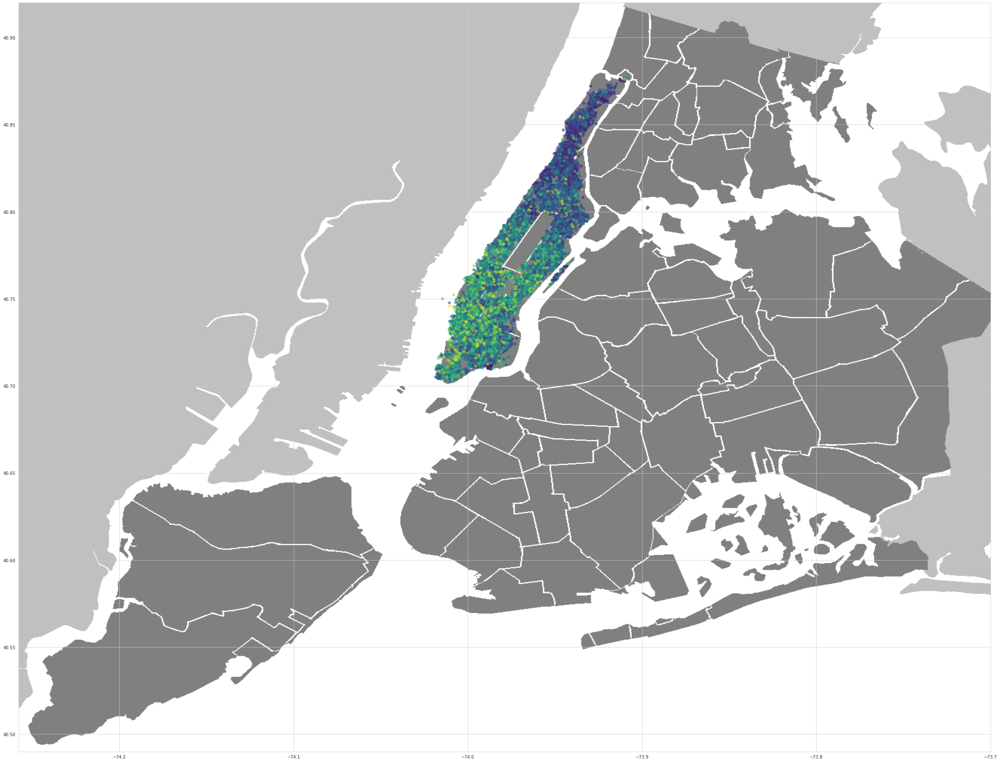

In [ ]:
import urllib

#1326 × 1291
fig = plt.figure(figsize=(96,32))
i = urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img = plt.imread(i)
image = plt.imshow(nyc_img[0:1326,0:1291], extent=[-74.258, -73.7, 40.49, 40.92])
plot = plt.scatter(manhattan_data['longitude'], manhattan_data['latitude'], c=manhattan_data['price'], cmap='viridis', linewidth=1, alpha=0.6)
plt.savefig('manhattan.png')

## Brooklyn

In [ ]:
brooklyn_data = data[data['neighbourhood_group']=='Brooklyn']

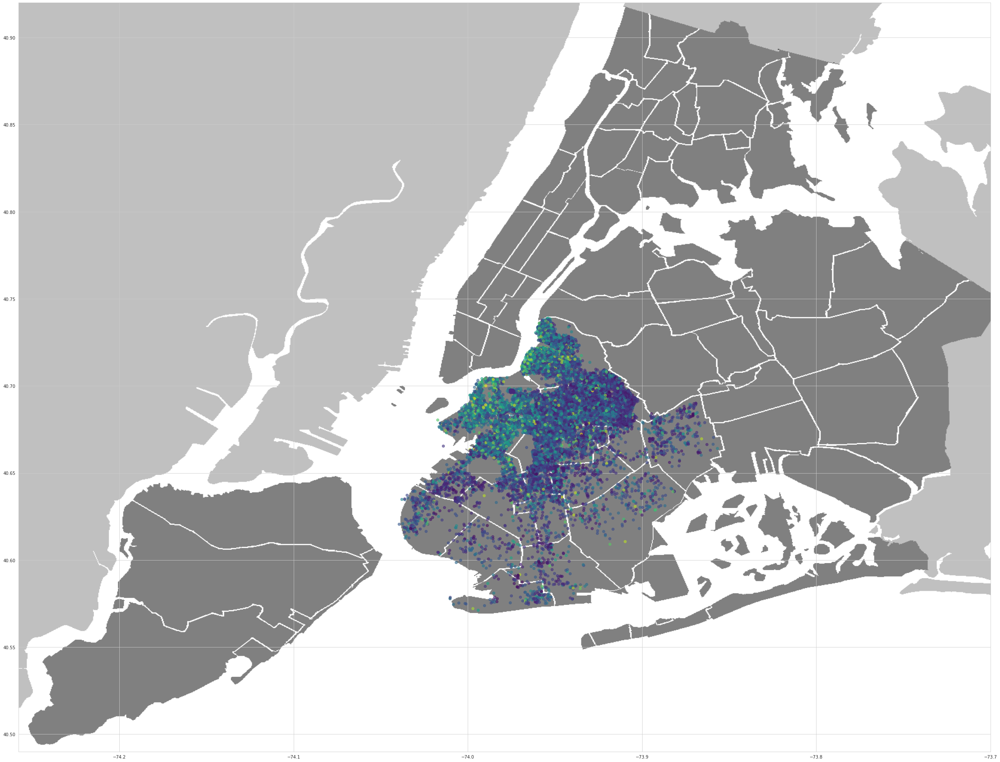

In [ ]:
import urllib

#1326 × 1291
fig = plt.figure(figsize=(96,32))
i = urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img = plt.imread(i)
image = plt.imshow(nyc_img[0:1326,0:1291], extent=[-74.258, -73.7, 40.49, 40.92])
plot = plt.scatter(brooklyn_data['longitude'], brooklyn_data['latitude'], c=brooklyn_data['price'], cmap='viridis', linewidth=1, alpha=0.6)
plt.savefig('brooklyn.png')

## Queens

In [ ]:
queens_data = data[data['neighbourhood_group']=='Queens']

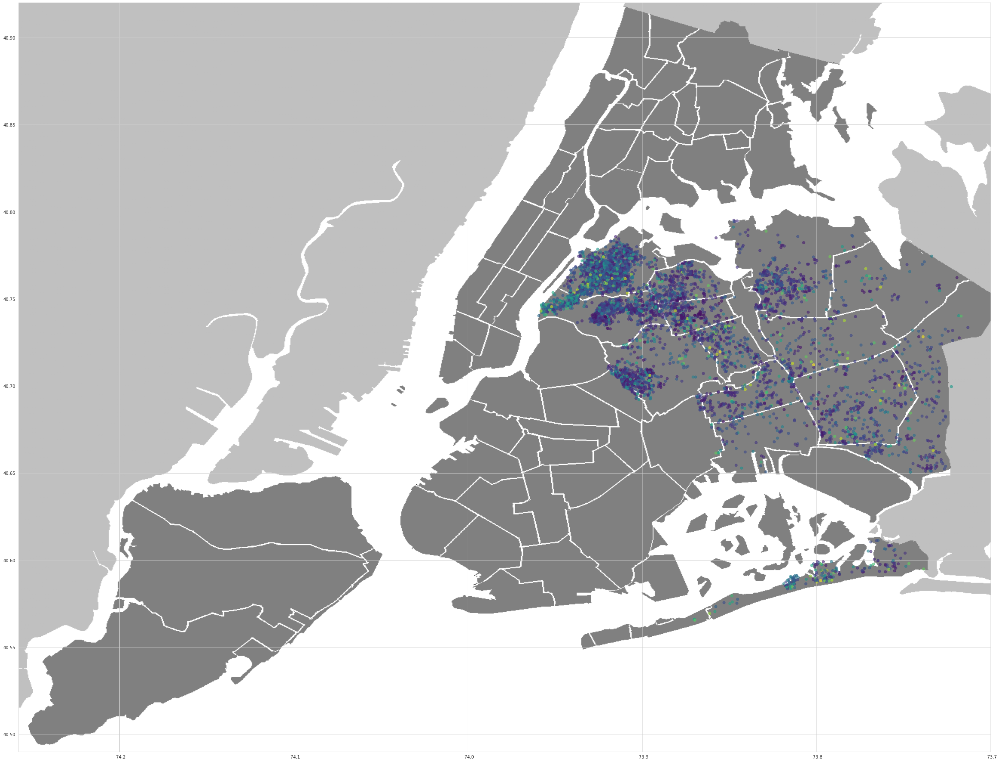

In [ ]:
import urllib

#1326 × 1291
fig = plt.figure(figsize=(96,32))
i = urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img = plt.imread(i)
image = plt.imshow(nyc_img[0:1326,0:1291], extent=[-74.258, -73.7, 40.49, 40.92])
plot = plt.scatter(queens_data['longitude'], queens_data['latitude'], c=queens_data['price'], cmap='viridis', linewidth=1, alpha=0.6)
plt.savefig('quuens.png')

## Bronx

In [ ]:
bronx_data = data[data['neighbourhood_group']=='Bronx']

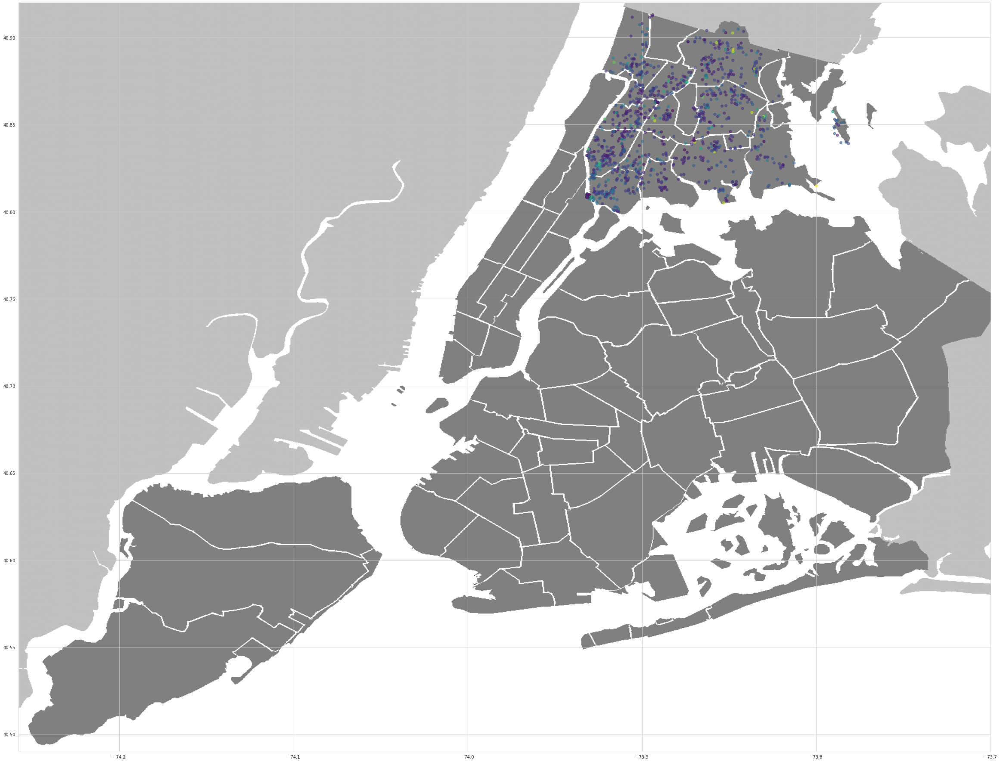

In [ ]:
import urllib

#1326 × 1291
fig = plt.figure(figsize=(96,32))
i = urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img = plt.imread(i)
image = plt.imshow(nyc_img[0:1326,0:1291], extent=[-74.258, -73.7, 40.49, 40.92])
plot = plt.scatter(bronx_data['longitude'], bronx_data['latitude'], c=bronx_data['price'], cmap='viridis', linewidth=1, alpha=0.6)
plt.savefig('bronx.png')

## Staten Island

In [ ]:
si_data = data[data['neighbourhood_group']=='Staten Island']

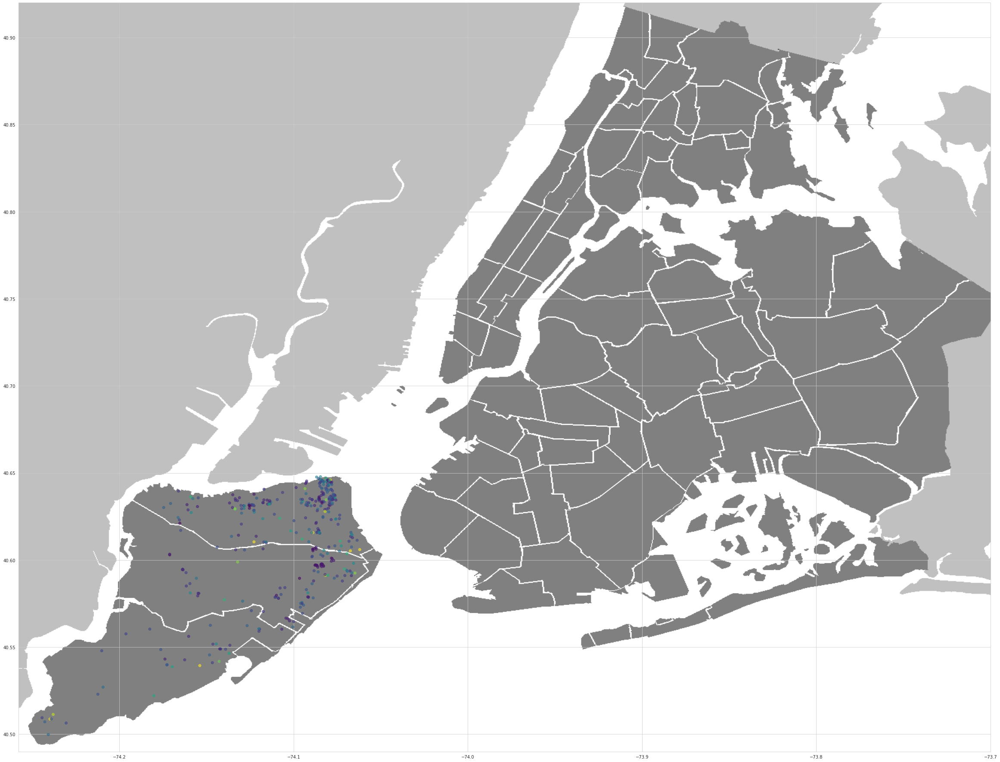

In [ ]:
import urllib

#1326 × 1291
fig = plt.figure(figsize=(96,32))
i = urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img = plt.imread(i)
image = plt.imshow(nyc_img[0:1326,0:1291], extent=[-74.258, -73.7, 40.49, 40.92])
plot = plt.scatter(si_data['longitude'], si_data['latitude'], c=si_data['price'], cmap='viridis', linewidth=1, alpha=0.6)
plt.savefig('staten_island.png')

# Distribution of price (after Tukey test) and without price equal to 0

Text(0.5, 0.98, 'Distribution of price (after Tukey test)')

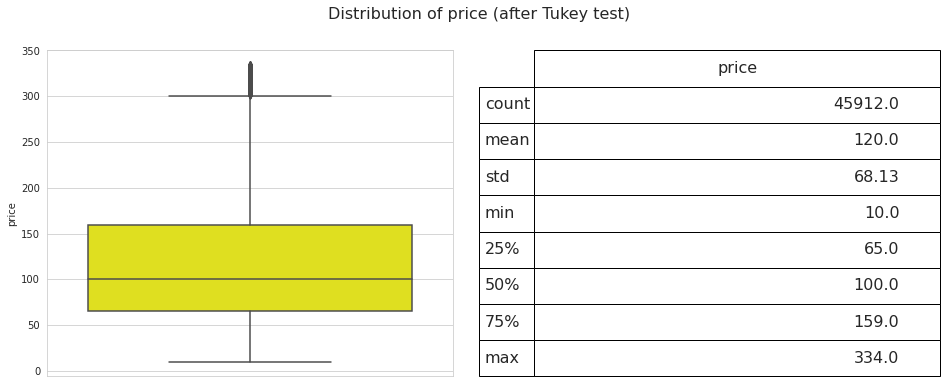

In [ ]:
fig = plt.figure(figsize=(16,6))

ax1 = fig.add_subplot(121)
sns.boxplot(y = data['price'], ax=ax1, color='yellow')
describe = data['price'].describe().to_frame().round(2)

ax2 = fig.add_subplot(122)
ax2.axis('off')
font_size = 16
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of price (after Tukey test)', fontsize=16)

Now as we can see, distribution of our target - 'price' looks way better. 

# Box-Cox transformation on 'price'

In [ ]:
data['price'],price_lambda = boxcox(data['price']) #############################

Text(0.5, 0.98, 'Distribution of price (after Box-Cox transformation)')

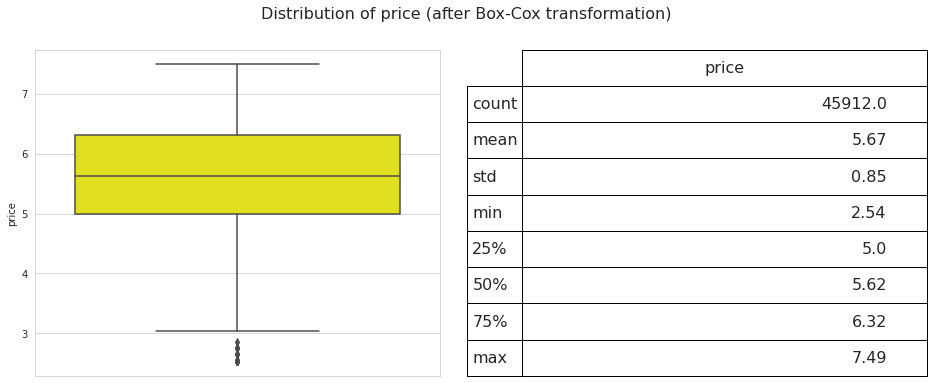

In [ ]:
fig = plt.figure(figsize=(16,6))

ax1 = fig.add_subplot(121)
sns.boxplot(y = data['price'], ax=ax1, color='yellow')
describe = data['price'].describe().to_frame().round(2)

ax2 = fig.add_subplot(122)
ax2.axis('off')
font_size = 16
bbox = [0, 0, 1, 1]
table = ax2.table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
table.set_fontsize(font_size)
fig.suptitle('Distribution of price (after Box-Cox transformation)', fontsize=16)

# Corellations between quantitative features and 'price' in dataset.

In [ ]:
data.columns

Index(['neighbourhood_group', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

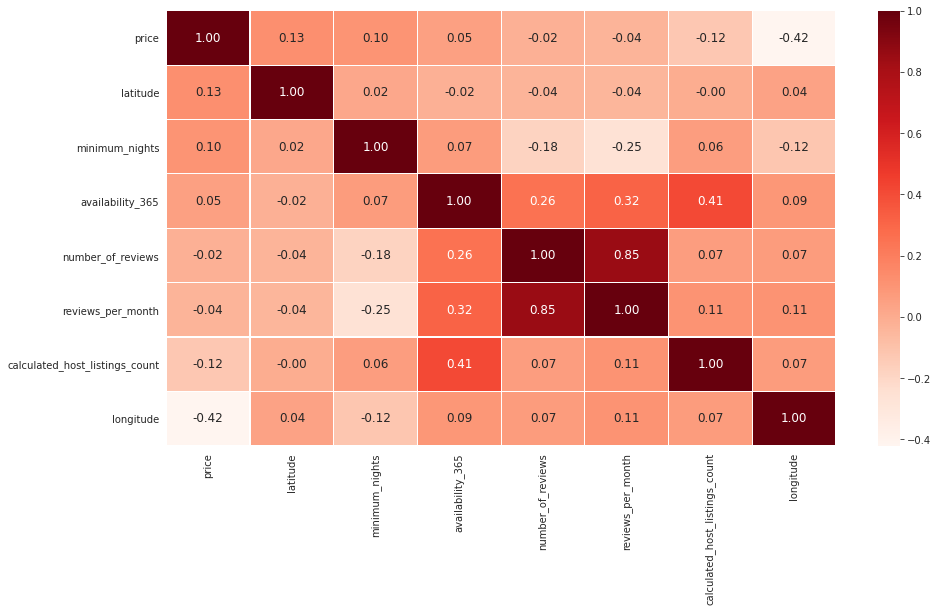

In [ ]:
top = 8
corr = data[['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count','neighbourhood', 'neighbourhood_group', 'room_type', 'availability_365']].corr(method='spearman')
top8 = abs(corr.nlargest(top,'price')['price']).index
corr_top8 = data[top8].corr(method='spearman')
plt.figure(figsize=(15,8))
sns.heatmap(corr_top8, annot=True, linewidths=0.1, fmt='.2f', cmap='Reds', annot_kws={'size':12})

Boxplots of particular quantitative features in dataset(apart of 'price' feature).

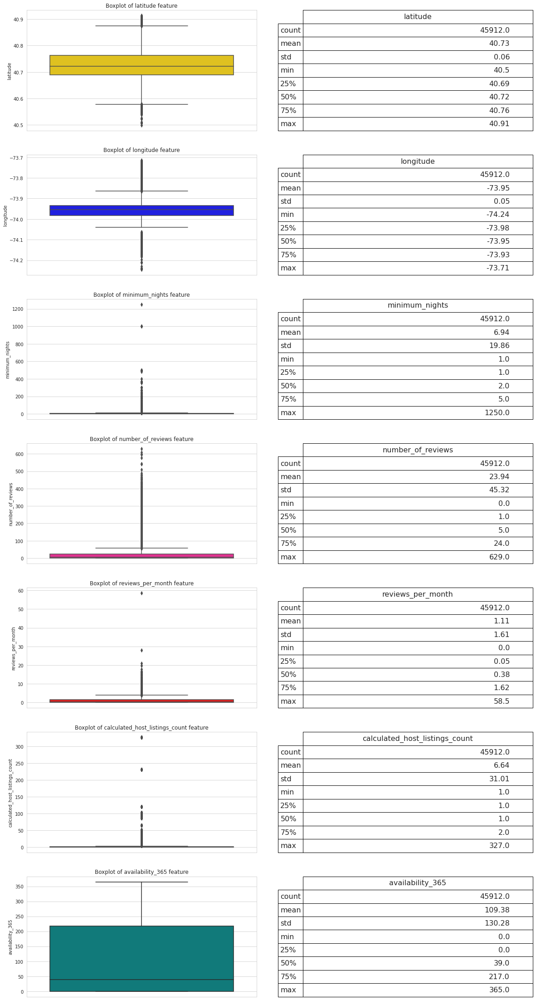

In [ ]:
dists = data[['latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365']]

fig, ax = plt.subplots(7,2,figsize=(20,40))
bbox = [0, 0, 1, 1]
fontsize = 15
colors = ['gold','blue','lawngreen','deeppink','red','orange','darkcyan','yellow']

for i in range(len(dists.columns)):
    describe = data[dists.columns[i]].describe().to_frame().round(2)
    sns.boxplot(y=data[dists.columns[i]],ax=ax[i][0], color=colors[i])
    table = ax[i][1].table(cellText = describe.values, rowLabels = describe.index, bbox=bbox, colLabels=describe.columns)
    table.set_fontsize(font_size)
    ax[i][1].axis('off')
    ax[i][0].title.set_text('Boxplot of {} feature'.format(dists.columns[i]))



plt.show()


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
`distplot` is a deprecated function and will be removed in a future version. Ple

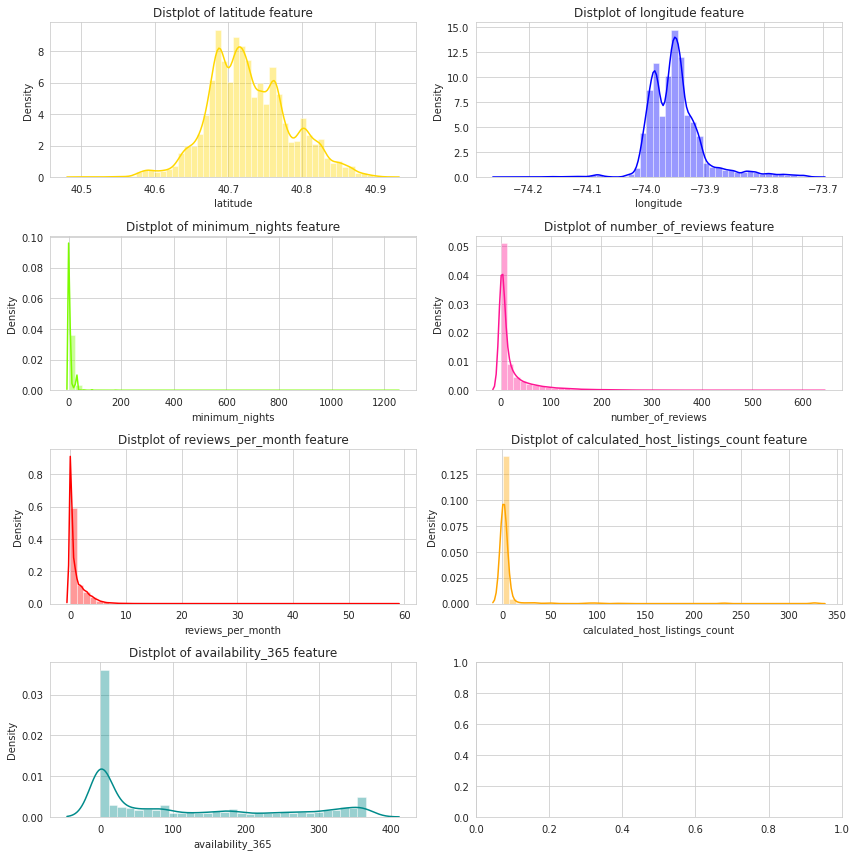

In [ ]:
dists = data[['latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365']]

colors = ['gold','blue','lawngreen','deeppink','red','orange','darkcyan','yellow']
fig, ax = plt.subplots(4,2,figsize=(12,12))
for i in range(len(dists.columns)):
    r=i//2
    c=i%2
    sns.distplot(data[dists.columns[i]],ax=ax[r][c], color=colors[i])
    ax[r][c].title.set_text('Distplot of {} feature'.format(dists.columns[i]))


plt.tight_layout()
plt.show()

In [ ]:
dists = data[['latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365']]

skewed_features = []
for column in dists:
    skew = abs(data[column].skew())
    print('{:15}'.format(column), 
          'Skewness: {:05.2f}'.format(skew),'Min value: {}'.format(data[column].min()))

latitude        Skewness: 00.26 Min value: 40.499790000000004
longitude       Skewness: 01.24 Min value: -74.24441999999999
minimum_nights  Skewness: 21.93 Min value: 1
number_of_reviews Skewness: 03.63 Min value: 0
reviews_per_month Skewness: 03.32 Min value: 0.0
calculated_host_listings_count Skewness: 08.40 Min value: 1
availability_365 Skewness: 00.81 Min value: 0


# Box-Cox transformation on quantitative features

Box-Cox 1p

y = ((1+x)**lmbda - 1) / lmbda  if lmbda != 0

    log(1+x)                    if lmbda == 0

Box-Cox

y = (x**lmbda - 1) / lmbda,  for lmbda > 0

    log(x),                  for lmbda = 0

In [ ]:
#Yeo-Johnson transformation
pt = PowerTransformer(method='yeo-johnson')

### ['minimum_nights']

In [ ]:
data['minimum_nights'],lam = boxcox(data['minimum_nights'])
print('"minimum_nights lambda: {}"'.format(lam))

"minimum_nights lambda: -0.4644546982027765"


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


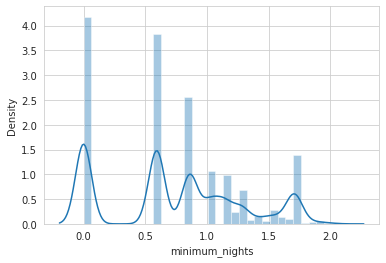

In [ ]:
sns.distplot(data['minimum_nights'])

### ['calculated_host_listings_count']

In [ ]:
values = data['calculated_host_listings_count'].values

In [ ]:
data1 = pd.DataFrame({'x':values})
pt.fit(data1)
print(pt.lambdas_)

[-1.84047863]


In [ ]:
data['calculated_host_listings_count']= boxcox1p(data['calculated_host_listings_count'],-1.84047863)
print('"calculated_host_listings_count lambda: {}"'.format(pt.lambdas_))

"calculated_host_listings_count lambda: [-1.84047863]"


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


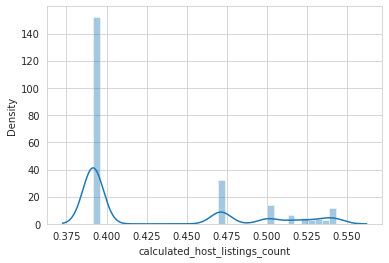

In [ ]:
sns.distplot(data['calculated_host_listings_count'])

### ['number_of_reviews']

In [ ]:
values = data['number_of_reviews'].values
data2 = pd.DataFrame({'x':values})
pt.fit(data2)
print(pt.lambdas_)

[-0.12794738]


In [ ]:
data['number_of_reviews']= boxcox1p(data['number_of_reviews'],-1.84047863)
print('"number_of_reviews lambda: {}"'.format(pt.lambdas_))

"number_of_reviews lambda: [-0.12794738]"


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


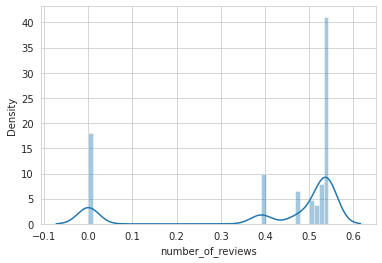

In [ ]:
sns.distplot(data['number_of_reviews'])

### ['reviews_per_month']

In [ ]:
values = data['reviews_per_month'].values
data3 = pd.DataFrame({'x':values})
pt.fit(data3)
print(pt.lambdas_)

[-1.04774384]


In [ ]:
data['reviews_per_month']= boxcox1p(data['reviews_per_month'],-1.84047863)
print('"reviews_per_month lambda: {}"'.format(pt.lambdas_))

"reviews_per_month lambda: [-1.04774384]"


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


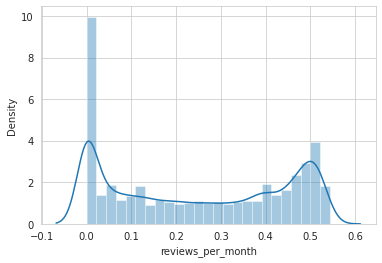

In [ ]:
sns.distplot(data['reviews_per_month'])

### ['availability_365']

In [ ]:
values = data['availability_365'].values
data4 = pd.DataFrame({'x':values})
pt.fit(data4)
print(pt.lambdas_)

[0.06779621]


In [ ]:
data['availability_365']= boxcox1p(data['availability_365'],-1.84047863)
print('"availability_365 lambda: {}"'.format(pt.lambdas_))

"availability_365 lambda: [0.06779621]"


`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).


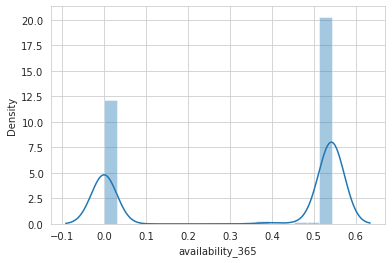

In [ ]:
sns.distplot(data['availability_365'])

### Convert 'object' features into quantative ones

In [ ]:
data_boxcoxed = copy(data)
# labelencoder = LabelEncoder()
# data['neighbourhood'] = labelencoder.fit_transform(data['neighbourhood'])

# Scatterplots

### Scatterplots of quantitative features oriented on 'price'.

In [ ]:
dists = data[['latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365','neighbourhood_group', 'neighbourhood', 'room_type']]

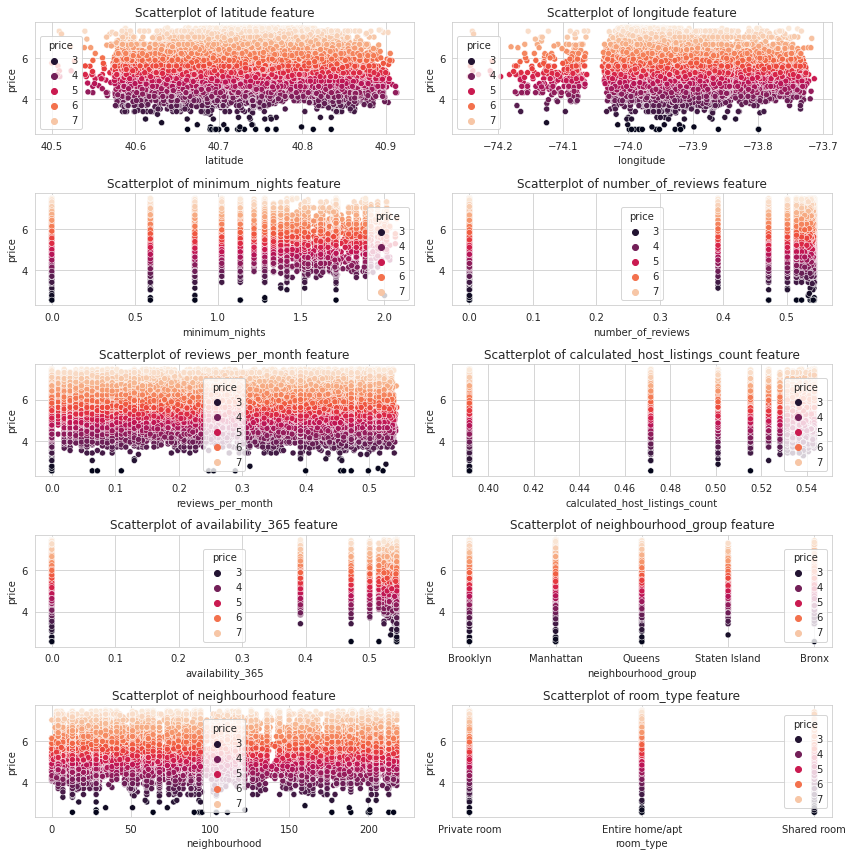

In [ ]:
fig, ax = plt.subplots(5,2,figsize=(12,12))
for i in range(len(dists.columns)):
    r=i//2
    c=i%2
    sns.scatterplot(x=data[dists.columns[i]], y=data['price'], ax=ax[r][c], hue=data['price'], palette='rocket')
    ax[r][c].title.set_text('Scatterplot of {} feature'.format(dists.columns[i]))

plt.tight_layout()
plt.show()

# Get dummy variables

In [ ]:
data['neighbourhood_group'] = labelencoder.fit_transform(data['neighbourhood_group'])

In [ ]:
data = pd.get_dummies(data)

In [ ]:
data.head()

,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,1,107,40.64749,-73.97237,6.217083,0.000000,0.535492,0.160773,0.528212,0.543327,0,1,0
1,2,126,40.75362,-73.98377,6.855013,0.000000,0.542864,0.242989,0.471402,0.543326,1,0,0
2,2,93,40.80902,-73.94190,6.227262,0.860488,0.000000,0.000000,0.391621,0.543327,0,1,0
3,1,41,40.68514,-73.95976,5.449882,0.000000,0.543319,0.520828,0.391621,0.543304,1,0,0
4,2,61,40.79851,-73.94399,5.295255,1.414135,0.535492,0.087419,0.391621,0.000000,1,0,0


# Pairplot after data processing

In [ ]:
# sns.pairplot(data)

# Corrplot after data processing

In [ ]:
data.head()

,neighbourhood_group,neighbourhood,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,1,107,40.64749,-73.97237,6.217083,0.000000,0.535492,0.160773,0.528212,0.543327,0,1,0
1,2,126,40.75362,-73.98377,6.855013,0.000000,0.542864,0.242989,0.471402,0.543326,1,0,0
2,2,93,40.80902,-73.94190,6.227262,0.860488,0.000000,0.000000,0.391621,0.543327,0,1,0
3,1,41,40.68514,-73.95976,5.449882,0.000000,0.543319,0.520828,0.391621,0.543304,1,0,0
4,2,61,40.79851,-73.94399,5.295255,1.414135,0.535492,0.087419,0.391621,0.000000,1,0,0


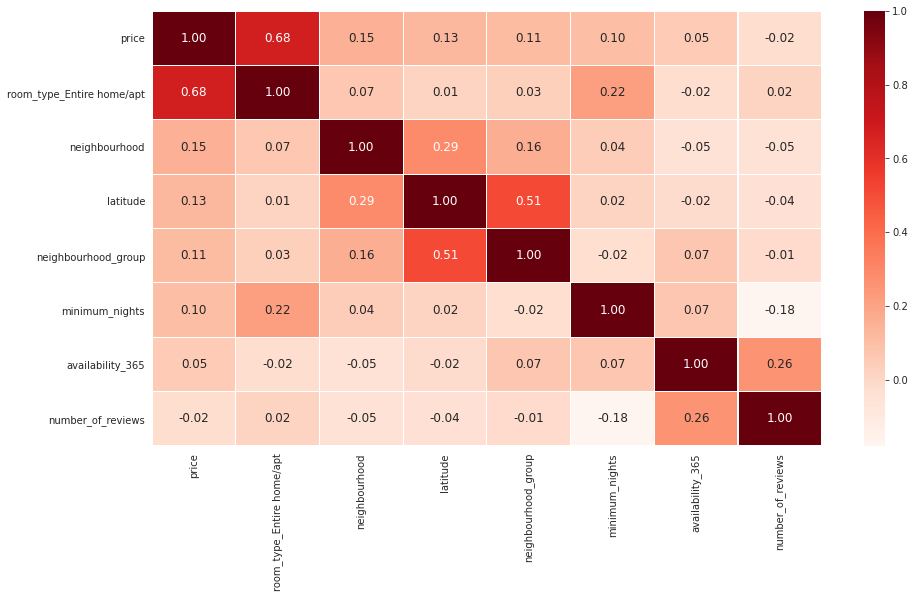

In [ ]:
top = 8
corr = data[['latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count','neighbourhood', 'neighbourhood_group', 'room_type_Entire home/apt', 'room_type_Private room', 'room_type_Shared room', 'availability_365']].corr(method='spearman')
top8 = abs(corr.nlargest(top,'price')['price']).index
corr_top8 = data[top8].corr(method='spearman')
plt.figure(figsize=(15,8))
sns.heatmap(corr_top8, annot=True, linewidths=0.1, fmt='.2f', cmap='Reds', annot_kws={'size':12})

# Linear regressions for particular features

In [ ]:
data.columns

Index(['neighbourhood_group', 'neighbourhood', 'latitude', 'longitude',
       'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'room_type_Entire home/apt', 'room_type_Private room',
       'room_type_Shared room'],
      dtype='object')

### Functions

In [ ]:
# AIC information criterium 
def calculate_aic(n, mse, num_params):
    aic = n * math.log(mse) + 2 * num_params
    return aic

# BIC information criterium 
def calculate_bic(n, mse, num_params):
    bic = n * math.log(mse) + num_params * math.log(n)
    return bic
 
def regression_single_target(data, target, multiple_columns=False):
  y = target.values
  y = y.reshape(-1, 1)
  y_train = y[:-20]
  y_test = y[-20:]
  summary = {}
  if multiple_columns:
    for column in data.columns:
      summary[str(column)] = None
      X = data[column].values
      X = X.reshape(-1, 1)
      X_train = X[:-20]
      X_test = X[-20:]
      regr = LinearRegression()
      regr.fit(X_train, y_train)
      target_y_pred = regr.predict(X_test)
      mse = mean_squared_error(y_test, target_y_pred)
      rmse = np.sqrt(mean_squared_error(y_test, target_y_pred))
      num_params = len(regr.coef_) + 1

      summary[str(column)] = {'Coefficietns': regr.coef_,
                              'MSE': mse,
                              'RMSE': rmse,
                              'R2': (r2_score(y_test, target_y_pred)),
                              'AIC': calculate_aic(len(y_test), mse, num_params),
                              'BIC': calculate_bic(len(y_test), mse, num_params)
                              }
  else:
      X = data.reshape(-1, 1)
      X_train = x[:-20]
      X_test = x[-20:]
      regr = LinearRegression()
      regr.fit(X_train, y_train)
      target_y_pred = regr.predict(X_test)
      # # The coefficients
      print('Coefficients: \n', regr.coef_)
      # The mean squared error
      print('Mean squared error: %.2f'
            % mean_squared_error(y_test, target_y_pred))
      # The coefficient of determination: 1 is perfect prediction
      print('Coefficient of determination: %.2f'
            % r2_score(y_test, target_y_pred))
      # Plot outputs
      plt.scatter(X_test, y_test,  color='black')
      plt.plot(X_test, y_pred, color='blue', linewidth=3)

      plt.xticks(())
      plt.yticks(())

      plt.show()
  return summary

In [ ]:
quantitative = data[['latitude', 'longitude', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365','neighbourhood','neighbourhood_group', 'room_type_Entire home/apt', 'room_type_Private room', 'room_type_Shared room',]]

In [ ]:
target = data['price']

In [ ]:
summary = regression_single_target(quantitative, target, multiple_columns=True)

In [ ]:
for i in summary.keys():
    print(i)
    print(summary[i])
    print('')

latitude
{'Coefficietns': array([[1.18887521]]), 'MSE': 0.6527718654933716, 'RMSE': 0.8079429840609866, 'R2': -0.17038597209873618, 'AIC': -4.530551489270994, 'BIC': -2.5390869421630127}

longitude
{'Coefficietns': array([[-5.97833372]]), 'MSE': 0.5303344991419146, 'RMSE': 0.7282406876451731, 'R2': 0.04913785178750385, 'AIC': -8.684946821171895, 'BIC': -6.693482274063913}

minimum_nights
{'Coefficietns': array([[0.1504777]]), 'MSE': 0.6573706425870648, 'RMSE': 0.8107839678897609, 'R2': -0.17863134001942527, 'AIC': -4.390145511975545, 'BIC': -2.3986809648675633}

number_of_reviews
{'Coefficietns': array([[-0.12784606]]), 'MSE': 0.6893855148825085, 'RMSE': 0.8302924273305813, 'R2': -0.23603233937897916, 'AIC': -3.439092726292298, 'BIC': -1.4476281791843162}

reviews_per_month
{'Coefficietns': array([[-0.13738947]]), 'MSE': 0.6765562672542897, 'RMSE': 0.8225304050637214, 'R2': -0.21303016626096394, 'AIC': -3.814793215321485, 'BIC': -1.8233286682135033}

calculated_host_listings_count
{'Co

# Predictive models

## Features

## Metric

In [ ]:
def rmse(actual,predicted):
    return(str(np.sqrt(mean_squared_error(actual, predicted))))

## Train test split 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(quantitative, target, test_size = .2, random_state=42)

In [ ]:
print('Dimensions of the training feature matrix: {}'.format(X_train.shape))
print('Dimensions of the training target vector: {}'.format(y_train.shape))
print('Dimensions of the test feature matrix: {}'.format(X_test.shape))
print('Dimensions of the test target vector: {}'.format(y_test.shape))

Dimensions of the training feature matrix: (36729, 12)
Dimensions of the training target vector: (36729,)
Dimensions of the test feature matrix: (9183, 12)
Dimensions of the test target vector: (9183,)


## Rescale the design matrix

RobustScaler() provides to each of our predictors zero mean and unit variance. This helps the convergence of machine learning algorithms such as linear regression.

In [ ]:
scaler = RobustScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

## Linear Regression

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

lin_reg_pred_train = lin_reg.predict(X_train)
lin_reg_pred_test = lin_reg.predict(X_test)

print('RMSE train = ' + rmse(y_train,lin_reg_pred_train))
print('RMSE test = ' + rmse(y_test,lin_reg_pred_test)) 

RMSE train = 46.320801662607984
RMSE test = 57.81023029942644


## Lasso Regression (L1 regularization)

In [ ]:
lasso_reg = Lasso()
parameters = {'alpha': [0.0005,0.001,0.1,0.2,0.4,0.5,0.7,0.8,1]}

lasso_reg = GridSearchCV(lasso_reg, param_grid=parameters)
lasso_reg.fit(X_train,y_train)
alpha = lasso_reg.best_params_
lasso_score = lasso_reg.best_score_
print("The best alpha value found is:",alpha['alpha'],'with score:',lasso_score)

lasso_reg_alpha = Lasso(alpha=alpha['alpha'])
lasso_reg_alpha.fit(X_train,y_train)
lasso_reg_pred_train = lasso_reg_alpha.predict(X_train)
lasso_reg_pred_test = lasso_reg_alpha.predict(X_test)

print('RMSE train = ' + rmse(y_train,lasso_reg_pred_train))
print('RMSE test = ' + rmse(y_test,lasso_reg_pred_test))

The best alpha value found is: 0.2 with score: 0.2406035735925606
RMSE train = 46.33793303253267
RMSE test = 57.15998124570197


Objective did not converge. You might want to increase the number of iterations. Duality gap: 1041.721979911381, tolerance: 70.03004117647053
Objective did not converge. You might want to increase the number of iterations. Duality gap: 824.5026385202073, tolerance: 59.59616274509803
Objective did not converge. You might want to increase the number of iterations. Duality gap: 1048.3673003308359, tolerance: 70.03004117647053
Objective did not converge. You might want to increase the number of iterations. Duality gap: 829.9802601128467, tolerance: 59.59616274509803


## Ridge Regression (L2 regularization)

In [ ]:
ridge = Ridge()
parameters = {'alpha': [0.0005,0.001,0.1,0.2,0.4,0.5,0.7,0.8,1]}

ridge_reg = GridSearchCV(ridge, param_grid=parameters)
ridge_reg.fit(X_train,y_train)
alpha = ridge_reg.best_params_
ridge_score = ridge_reg.best_score_
print("The best alpha value found is:",alpha['alpha'],'with score:',ridge_score)

ridge_reg_alpha = Ridge(alpha=alpha['alpha'])
ridge_reg_alpha.fit(X_train,y_train)
ridge_reg_pred_train = ridge_reg_alpha.predict(X_train)
ridge_reg_pred_test = ridge_reg_alpha.predict(X_test)

print('RMSE train = ' + rmse(y_train,ridge_reg_pred_train))
print('RMSE test = ' + rmse(y_test,ridge_reg_pred_test))

The best alpha value found is: 1 with score: 0.23937446845477622
RMSE train = 46.30915149957402
RMSE test = 57.3974192589461


## Random Forest

In [ ]:
rfr_reg = RandomForestRegressor(random_state=42)
rfr_reg.fit(X_train, y_train) 
rfr_pred_train = rfr_reg.predict(X_train)
rfr_pred_test = rfr_reg.predict(X_test)

print('RMSE train = ' + rmse(y_train,rfr_pred_train))
print('RMSE test = ' + rmse(y_test,rfr_pred_test)) 

RMSE train = 17.46790269911882
RMSE test = 56.33874967147789


## XGBoost Regressor

In [ ]:
import xgboost as xgb 

xgb_reg = xgb.XGBRegressor(n_estimators=1000)
xgb_reg.fit(X_train, y_train, early_stopping_rounds=5, 
             eval_set=[(X_test, y_test)], verbose=False)

[19:45:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [ ]:
xgb_reg_param = xgb.XGBRegressor(learning_rate=0.05,
                      n_estimators=1000,
                      max_depth=3)

xgb_reg_param.fit(X_train, y_train)
xgb_pred_train = xgb_reg_param.predict(X_train)
xgb_pred_test = xgb_reg_param.predict(X_test)

print('RMSE train = ' + rmse(y_train,xgb_pred_train))
print('RMSE test = ' + rmse(y_test,xgb_pred_test))

[19:45:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE train = 15.343851811919071
RMSE test = 62.06584105695149


## Scores after inversion from box-cox transformation

## Inversion from box-cox transformation

In [ ]:
traget = 'price'
y_test = inv_boxcox(y_test, price_lambda)
y_train = inv_boxcox(y_train, price_lambda)

In [ ]:
lin_reg_target = 'price'
lin_reg_pred_train = inv_boxcox(lin_reg_pred_train, price_lambda)
lin_reg_pred_test = inv_boxcox(lin_reg_pred_test, price_lambda)

In [ ]:
xgb_reg_target = 'price'
xgb_pred_train = inv_boxcox(xgb_pred_train, price_lambda)
xgb_pred_test = inv_boxcox(xgb_pred_test, price_lambda)

## Scores after inversion from box-cox transformation

In [ ]:
def calculate_scores(y_train,y_test, y_hat_trian, y_hat_test, features):
    #RMSE
    rmse_score_train = rmse(y_train,y_hat_trian)
    rmse_score_test = rmse(y_test,y_hat_test)
    print('RMSE train = {}'.format(rmse_score_train))
    print('RMSE test = {}' .format(rmse_score_test)) 
    print()
    #MSE
    mse_score_train = math.pow(float(rmse_score_train),2)
    mse_score_test = math.pow(float(rmse_score_test),2)
    print('MSE train = {}'.format(mse_score_train))
    print('MSE test = {}' .format(mse_score_test)) 
    print()
    #R2
    r2_score_trian = r2_score(y_train, y_hat_trian)
    r2_score_test = r2_score(y_test, y_hat_test)
    print('R2 train = {}'.format(r2_score_trian))
    print('R2 test = {}' .format(r2_score_test)) 
    print()
    #AIC
    #quantitative columns without price
    num_params = len(quantitative) + 1
    AIC_score_train = calculate_aic(len(y_train), mse_score_train, num_params)
    AIC_score_test = calculate_aic(len(y_test), mse_score_test, num_params)
    print('AIC train = {}'.format(AIC_score_train))
    print('AIC test = {}' .format(AIC_score_test)) 
    print()
    #BIC
    #quantitative columns without price
    BIC_score_train = calculate_bic(len(y_train), mse_score_train, num_params)
    BIC_score_test = calculate_bic(len(y_test), mse_score_test, num_params)
    print('BIC train = {}'.format(BIC_score_train))
    print('BIC test = {}' .format(BIC_score_test)) 
    print()

### Linear regression

In [ ]:
calculate_scores(y_train, y_test, lin_reg_pred_train, lin_reg_pred_test, quantitative)

RMSE train = 46.320801662607984
RMSE test = 57.81023029942644

MSE train = 2145.616666666667
MSE test = 3342.0227272727234

R2 train = 0.29680260117879365
R2 test = 0.13973264205280278

AIC train = 2688.1514814847096
AIC test = 1624.5764660596005

BIC train = 3984.253939012693
BIC test = 2612.952279939625



### Lasso regression

In [ ]:
calculate_scores(y_train, y_test, lasso_reg_pred_train, lasso_reg_pred_test, quantitative)

RMSE train = 46.33793303253267
RMSE test = 57.15998124570197

MSE train = 2147.204037727482
MSE test = 3267.263456009001

R2 train = 0.29628236137162256
R2 test = 0.15897636539653437

AIC train = 2688.340065945524
AIC test = 1622.087885491162

BIC train = 3984.442523473508
BIC test = 2610.4636993711865



### Ridge regression

In [ ]:
calculate_scores(y_train, y_test, ridge_reg_pred_train, ridge_reg_pred_test, quantitative)

RMSE train = 46.30915149957402
RMSE test = 57.3974192589461

MSE train = 2144.5375126104987
MSE test = 3294.4637375872367

R2 train = 0.29715627960468116
R2 test = 0.15197476299037005

AIC train = 2688.0231950508764
AIC test = 1622.9998551672288

BIC train = 3984.1256525788604
BIC test = 2611.3756690472533



### Random forest

In [ ]:
calculate_scores(y_train, y_test, rfr_pred_train, rfr_pred_test, quantitative)

RMSE train = 17.46790269911882
RMSE test = 56.33874967147789

MSE train = 305.12762470588257
MSE test = 3174.05471454545

R2 train = 0.8999984688154905
R2 test = 0.18296915189139684

AIC train = 2190.7861833396555
AIC test = 1618.9041653224367

BIC train = 3486.8886408676394
BIC test = 2607.279979202461



### XGBoost regressor

In [ ]:
calculate_scores(y_train, y_test, xgb_pred_train, xgb_pred_test, quantitative)

RMSE train = 15.343851811919071
RMSE test = 62.06584105695149

MSE train = 235.43378842613217
MSE test = 3852.1686261067653

R2 train = 0.9228396991000823
R2 test = 0.008416400252228451

AIC train = 2124.6645787901284
AIC test = 1640.20307030285

BIC train = 3420.7670363181123
BIC test = 2628.5788841828744



## Model interpretations

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=quantitative.columns, class_names=['price'], verbose=True, mode='regression')
i = 550

### Linear regression

In [ ]:
eli5.show_weights(lin_reg, feature_names=list(quantitative.columns))

Weight?,Feature
+5.431,<BIAS>
+0.893,room_type_Entire home/apt
+0.205,availability_365
+0.088,latitude
+0.084,neighbourhood
+0.062,neighbourhood_group
-0.004,calculated_host_listings_count
-0.029,number_of_reviews
-0.065,reviews_per_month
-0.168,room_type_Private room


In [ ]:
exp = explainer.explain_instance(X_test[i], lin_reg.predict, num_features=5)

Intercept 5.592386655548801
Prediction_local [5.00148397]
Right: 5.122484007252229


In [ ]:
exp.show_in_notebook(show_table=True)

### Lasso regression

In [ ]:
eli5.show_weights(lasso_reg_alpha, feature_names=list(quantitative.columns))

Weight?,Feature
+5.259,<BIAS>
+1.059,room_type_Entire home/apt
+0.198,availability_365
+0.087,latitude
+0.082,neighbourhood
+0.062,neighbourhood_group
-0.003,calculated_host_listings_count
-0.030,number_of_reviews
-0.057,reviews_per_month
-0.180,minimum_nights


In [ ]:
exp = explainer.explain_instance(X_test[i], lasso_reg_alpha.predict, num_features=5)

Intercept 5.731698133486824
Prediction_local [5.09753419]
Right: 5.122755297441999


In [ ]:
exp.show_in_notebook(show_table=True)

### Ridge regression

In [ ]:
eli5.show_weights(ridge_reg_alpha, feature_names=list(quantitative.columns))

Weight?,Feature
+5.432,<BIAS>
+0.892,room_type_Entire home/apt
+0.205,availability_365
+0.088,latitude
+0.084,neighbourhood
+0.062,neighbourhood_group
-0.004,calculated_host_listings_count
-0.029,number_of_reviews
-0.065,reviews_per_month
-0.168,room_type_Private room


In [ ]:
exp = explainer.explain_instance(X_test[i], ridge_reg_alpha.predict, num_features=5)

Intercept 5.583042418794347
Prediction_local [5.00154639]
Right: 5.122519470513167


In [ ]:
exp.show_in_notebook(show_table=True)

### Random forest

In [ ]:
eli5.show_weights(rfr_reg, feature_names=list(quantitative.columns))

Weight,Feature
0.4375 ± 0.0080,room_type_Entire home/apt
0.1678 ± 0.0074,longitude
0.1390 ± 0.0078,latitude
0.0583 ± 0.0040,availability_365
0.0531 ± 0.0045,reviews_per_month
0.0430 ± 0.0030,minimum_nights
0.0398 ± 0.0033,number_of_reviews
0.0252 ± 0.0029,calculated_host_listings_count
0.0235 ± 0.0063,neighbourhood
0.0066 ± 0.0036,room_type_Private room


In [ ]:
exp = explainer.explain_instance(X_test[i], rfr_reg.predict, num_features=5)

Intercept 6.229492897819003
Prediction_local [4.90774562]
Right: 4.776567636384135


In [ ]:
exp.show_in_notebook(show_table=True)

### XGBoost regressor

In [ ]:
eli5.show_weights(xgb_reg_param, feature_names=list(quantitative.columns))

Weight,Feature
0.8697,room_type_Entire home/apt
0.0253,room_type_Private room
0.0244,longitude
0.0185,room_type_Shared room
0.0151,latitude
0.0130,availability_365
0.0125,minimum_nights
0.0056,calculated_host_listings_count
0.0052,neighbourhood
0.0045,reviews_per_month


In [ ]:
exp = explainer.explain_instance(X_test[i], xgb_reg_param.predict, num_features=5)

Intercept 6.327341528404963
Prediction_local [4.57505331]
Right: 4.7286234


In [ ]:
exp.show_in_notebook(show_table=True)

# Predictions for particular neighbourhood groups

In [ ]:
# data = data_boxcoxed
data = data.join(pd.get_dummies(data['room_type']))
data = data.drop('room_type', axis=1)
data = data.drop('neighbourhood', axis=1)
neighbourhoods = [pd.DataFrame(y) for x, y in data.groupby('neighbourhood_group', as_index=False)]

In [ ]:
data

,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,Entire home/apt,Private room,Shared room
0,Brooklyn,40.64749,-73.97237,149,1,9,0.21,6,365,0,1,0
1,Manhattan,40.75362,-73.98377,225,1,45,0.38,2,355,1,0,0
2,Manhattan,40.80902,-73.94190,150,3,0,0.00,1,365,0,1,0
3,Brooklyn,40.68514,-73.95976,89,1,270,4.64,1,194,1,0,0
4,Manhattan,40.79851,-73.94399,80,10,9,0.10,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
45907,Brooklyn,40.67853,-73.94995,70,2,0,0.00,2,9,0,1,0
45908,Brooklyn,40.70184,-73.93317,40,4,0,0.00,2,36,0,1,0
45909,Manhattan,40.81475,-73.94867,115,10,0,0.00,1,27,1,0,0
45910,Manhattan,40.75751,-73.99112,55,1,0,0.00,6,2,0,0,1


In [ ]:
for i in range(len(neighbourhoods)):
  print('Neighbourhood {} results:'.format(neighbourhoods[i]['neighbourhood_group'].unique()[0]))

  quantitative = neighbourhoods[i][neighbourhoods[i].columns]
    
  quantitative = quantitative.drop('price', axis=1)

  quantitative = quantitative.drop(['neighbourhood_group',
       'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count'], axis=1)
    
  target = neighbourhoods[i]['price']

  X_train, X_test, y_train, y_test = train_test_split(quantitative, target, test_size = .3, random_state=0)
  lin_reg = LinearRegression()
  lin_reg.fit(X_train, y_train)
  y_pred_train = lin_reg.predict(X_train)
  y_pred_test = lin_reg.predict(X_test)
  print('RMSE linear_reg train = ' + rmse(y_train,y_pred_train))
  print('RMSE linear_reg test = ' + rmse(y_test,y_pred_test)) 

  xgb_reg = xgb.XGBRegressor(n_estimators=1000)
  xgb_reg.fit(X_train, y_train, early_stopping_rounds=5, 
               eval_set=[(X_test, y_test)], verbose=False)
  xgb_reg_param = xgb.XGBRegressor(learning_rate=0.05,
                      n_estimators=1000,
                      max_depth=3)
  xgb_reg_param.fit(X_train, y_train)
  xgb_train_pred = xgb_reg_param.predict(X_train)
  xgb_test_pred = xgb_reg_param.predict(X_test)
  print('RMSE XGB train = ' + rmse(y_train,xgb_train_pred))
  print('RMSE XGB test = ' + rmse(y_test,xgb_test_pred))
  print()
  print()

Neighbourhood Bronx results:
RMSE linear_reg train = 39.024265262813195
RMSE linear_reg test = 40.51298783604136
[19:59:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:59:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE XGB train = 14.95650534728874
RMSE XGB test = 46.06545229410971


Neighbourhood Brooklyn results:
RMSE linear_reg train = 44.48580245302856
RMSE linear_reg test = 43.58155093259048
[19:59:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[19:59:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE XGB train = 39.670671297166514
RMSE XGB test = 42.0823228131984


Neighbourhood Manhattan results:
RMSE linear_reg train = 52.69087641740779
RMSE linear_reg test = 52.558843920072626
[19:5

In [ ]:
data.groupby(["neighbourhood_group"])['price'].mean()

neighbourhood_group
Bronx             77.437792
Brooklyn         105.748634
Manhattan        145.960318
Queens            88.904437
Staten Island     89.235616
Name: price, dtype: float64